In [1]:
import scanpy as sc
import pandas as pd
from pathlib import Path
import anndata as ad
import numpy as np
import os
import scvi

%config InlineBackend.figure_format = 'retina'
%matplotlib inline

import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns

DPI = 300
FONTSIZE = 20  # 42

sc.settings.set_figure_params(
    scanpy=True, dpi=100, transparent=True, vector_friendly=True, dpi_save=DPI
)
from matplotlib import rcParams

rcParams["pdf.fonttype"] = 42

Global seed set to 0


In [2]:
DIR2SAVE = Path(
    "/data/BCI-CRC/nasrine/data/CRC/Primary_CRC_dataset/subpopulations/Endothelial"
)
DIR2SAVE.mkdir(parents=True, exist_ok=True)

In [3]:
FIG2SAVE = DIR2SAVE.joinpath("figures/")
FIG2SAVE.mkdir(parents=True, exist_ok=True)
# set the global variable: sc.settings.figdir to save all plots
sc.settings.figdir = FIG2SAVE

In [4]:
adata = sc.read_h5ad(
    DIR2SAVE.joinpath("SMC_KUL_Pelka_Che_Wu_CRC_integrated_scvi_hvg_Endothelial.h5ad")
)

In [5]:
adata

AnnData object with n_obs × n_vars = 3659 × 2000
    obs: 'Patient', 'Sample', 'Cell_type', 'Cell_subtype', 'Tissue', 'Therapy', 'doublet_score', 'predicted_doublet', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'cell_source', '_scvi_batch', '_scvi_labels'
    var: 'n_cells_by_counts-Che', 'total_counts-Che', 'mean_counts-Che', 'pct_dropout_by_counts-Che', 'n_cells_by_counts-KUL', 'total_counts-KUL', 'mean_counts-KUL', 'pct_dropout_by_counts-KUL', 'n_cells_by_counts-Pelka', 'total_counts-Pelka', 'mean_counts-Pelka', 'pct_dropout_by_counts-Pelka', 'n_cells_by_counts-SMC', 'total_counts-SMC', 'mean_counts-SMC', 'pct_dropout_by_counts-SMC', 'n_cells_by_counts-Wu', 'total_counts-Wu', 'mean_counts-Wu', 'pct_dropout_by_counts-Wu', 'n_cells', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'Cell_type_colors', 'Therapy_colors', 'Tissue_colors', '_scvi_manag

### Leiden clustering

In [6]:
adata.uns["neighbors"]

OverloadedDict, wrapping:
	{'connectivities_key': 'connectivities', 'distances_key': 'distances', 'params': {'method': 'umap', 'metric': 'euclidean', 'n_neighbors': 15, 'n_pcs': 10, 'random_state': 7, 'use_rep': 'X_scVI'}}
With overloaded keys:
	['connectivities', 'distances'].

In [7]:
# neighbors were already computed using Harmony corrected PCs, so we perform clustering on that graph
sc.tl.leiden(adata, key_added="leiden_scVI", resolution=1, random_state=7)

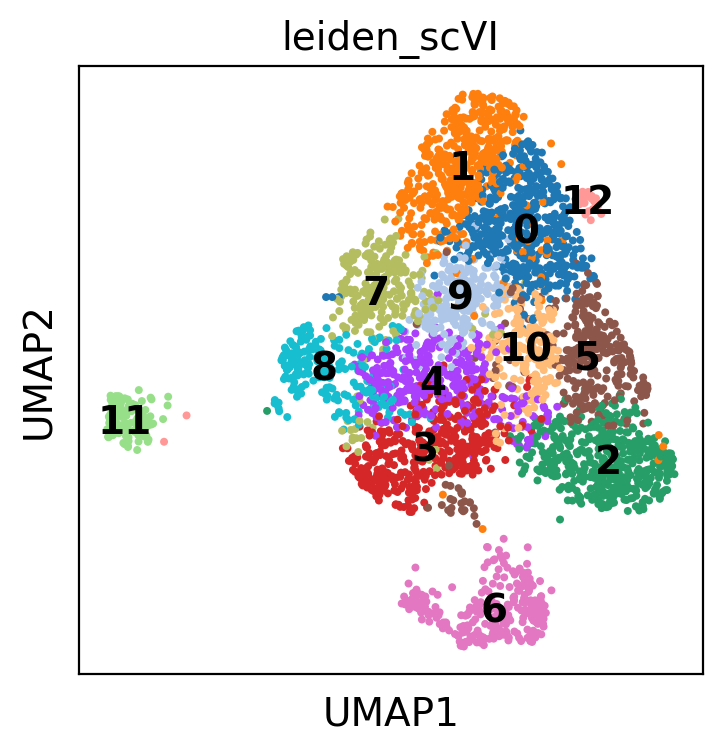

In [8]:
sc.pl.umap(
    adata,
    color="leiden_scVI",
    legend_loc="on data",
    save="general_clustering.pdf",
    show=True,
)

In [9]:
# load cell cycle scores saved from integration
cell_cycle_scores = pd.read_csv(
    "/data/BCI-CRC/nasrine/data/CRC/Primary_CRC_dataset/data_integration/SMC_KUL_Pelka_Che_Wu_CRC_integrated_scvi_hvg_cc_scores.txt",
    sep="\t",
    index_col=0,
)

In [10]:
adata.obs = adata.obs.merge(
    cell_cycle_scores, how="left", left_index=True, right_index=True
)

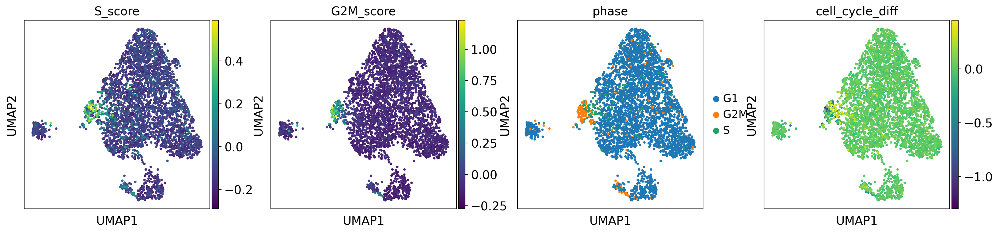

In [11]:
sc.pl.umap(
    adata,
    color=["S_score", "G2M_score", "phase", "cell_cycle_diff"],
    color_map="viridis",
    save="cell_cycle.pdf",
)

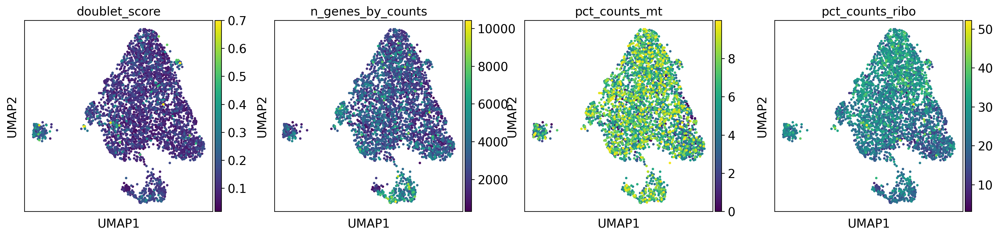

In [12]:
sc.pl.umap(
    adata,
    color=["doublet_score", "n_genes_by_counts", "pct_counts_mt", "pct_counts_ribo"],
    color_map="viridis",
    save="QC_covariates.pdf",
)

### Look at distribution of cell source across clusters 

In [13]:
from matplotlib.patches import Rectangle


def proportion_cells_patient(
    adata, groupby_labels, xlabel: str, ylabel: str, colors: dict, figname: str
):  # colors
    # compute proportion of cells within each group
    table2plot = (
        adata.reset_index()
        .groupby(groupby_labels)
        .size()
        .groupby(level=0)
        .apply(lambda x: x * 100 / x.sum())
        .unstack()
    )

    fig, ax = plt.subplots(
        nrows=1,
        ncols=1,
        sharey=False,
        sharex=False,
        dpi=DPI,
    )  # figsize=(4, 4))

    print(table2plot)
    table2plot.plot.bar(stacked=True, ax=ax, color=colors.values())  # , color=colors
    ax.set_ylabel(ylabel)
    ax.set_xlabel(xlabel)
    ax.grid(False, which="major", axis="both")  # removes major horizontal gridlinesd

    labels = list(colors.keys())
    l = [Rectangle((0, 0), 0, 0, color=color) for color in list(colors.values())]
    ax.legend(
        l,
        labels,
        loc="upper left",
        bbox_to_anchor=(1, 0.8),
        facecolor="white",
        edgecolor="white",
        ncol=1,
        borderaxespad=0.0,
        framealpha=0,
        frameon=False,
    )

    plt.savefig(FIG2SAVE.joinpath(figname), dpi=DPI, format="pdf", bbox_inches="tight")
    plt.show()

cell_source        SMC        KUL      Pelka        Che
leiden_scVI                                            
0            17.161017  18.220339  60.593220   4.025424
1            13.390929  11.879050  70.410367   4.319654
2            20.990566  12.028302  63.207547   3.773585
3            18.481013  12.151899  67.848101   1.518987
4            21.806854  12.149533  63.862928   2.180685
5            14.851485  16.501650  61.716172   6.930693
6            12.367491   3.533569  82.685512   1.413428
7            30.578512  10.330579  57.024793   2.066116
8            25.000000   3.240741  71.296296   0.462963
9            26.341463  15.609756  51.707317   6.341463
10           12.903226  19.354839  53.225806  14.516129
11           20.472441  24.409449  21.259843  33.858268
12           13.636364  13.636364  36.363636  36.363636


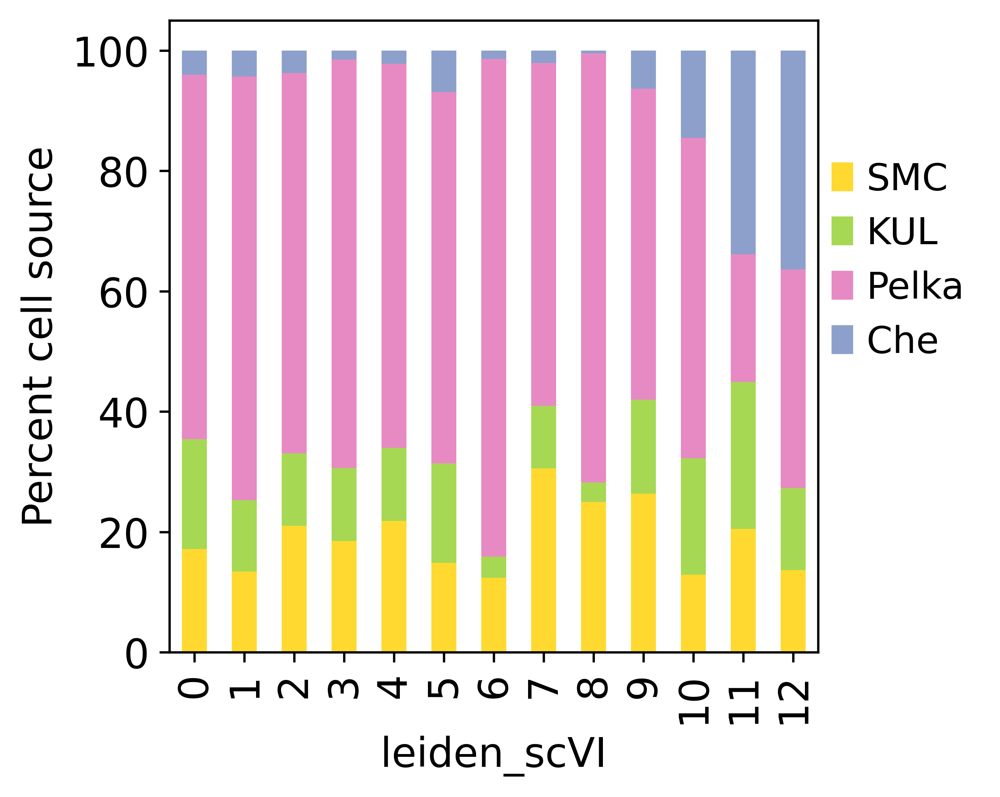

In [14]:
from collections import OrderedDict

color_dict = OrderedDict(
    zip(
        adata.obs["cell_source"].cat.categories.values.tolist(),
        adata.uns["cell_source_colors"],
    )
)

proportion_cells_patient(
    adata.obs,
    groupby_labels=["leiden_scVI", "cell_source"],
    xlabel="leiden_scVI",
    ylabel="Percent cell source",
    colors=color_dict,
    figname="leiden_cell_source.pdf",
)

### Plot some markers 
* for tip and stalk like endothelial cells: https://www.ncbi.nlm.nih.gov/pmc/articles/PMC6732145/
* for pericytes and smooth muscle cells, tip and stalk looked at Lee paper Nature Genetics 2021 supplementary fg 7
* for myeloid look at pelka as well

In [23]:
markers = {
    "Endo": ["PECAM1"],
    "Lymph endo": ["LYVE1", "PROX1"],
    "Stalk": ["ACKR1", "SELP"],
    "Tip": ["RGCC", "KDR"],
    "Enteric glial": ["S100B", "PLP1"],
    "Prolif endo": ["BIRC5", "MKI67"],
}

markers_cel = {
    "Endo": ["PECAM1", "TM4SF1", "PLVAP"],
    "Venous": ["PLVAP", "ACKR1", "COL15A1", "TSHZ2", "OLFM1"],
    "Arterial": ["EFNB2"],
    "Capillary": ["RGCC", "FCN3"],
    "Lymphatic": ["PROX1", "LYVE1"],
    "Enteric glial": ["S100B", "PLP1"],
    "Prolif endo": ["BIRC5", "MKI67"],
}

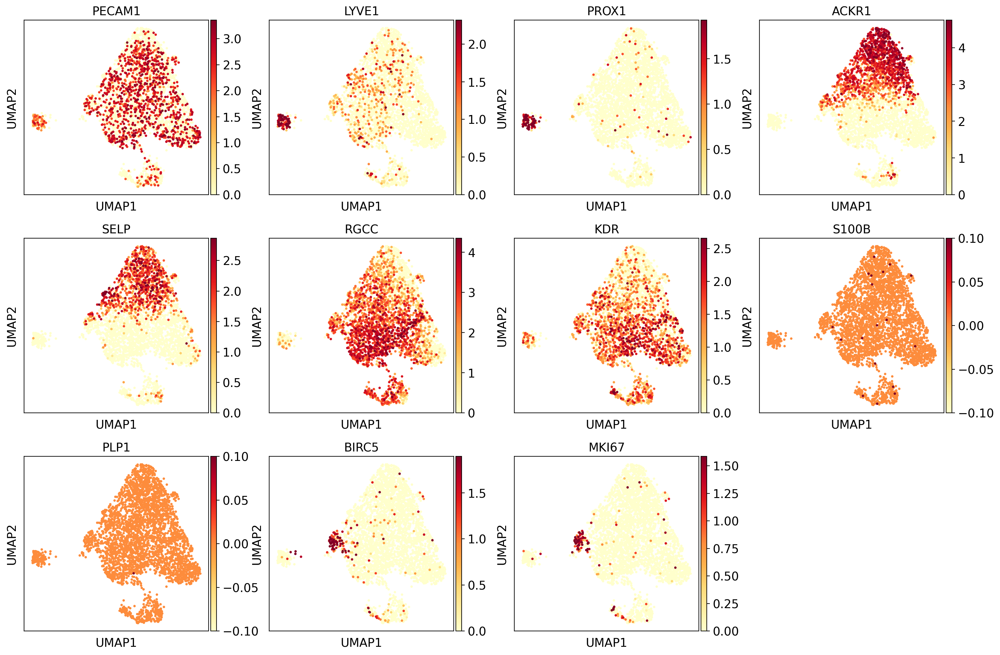

In [16]:
import itertools

# use log1p data stored in .raw
markers2plot = list(
    itertools.chain(*list(markers.values()))
)  # get all markers in a single list
sc.pl.umap(
    adata,
    color=markers2plot,
    use_raw=True,
    vmin=0.0,
    vmax="p99",
    color_map="YlOrRd",  #'RdPu',
    save="general_markers.pdf",
    show=True,
)

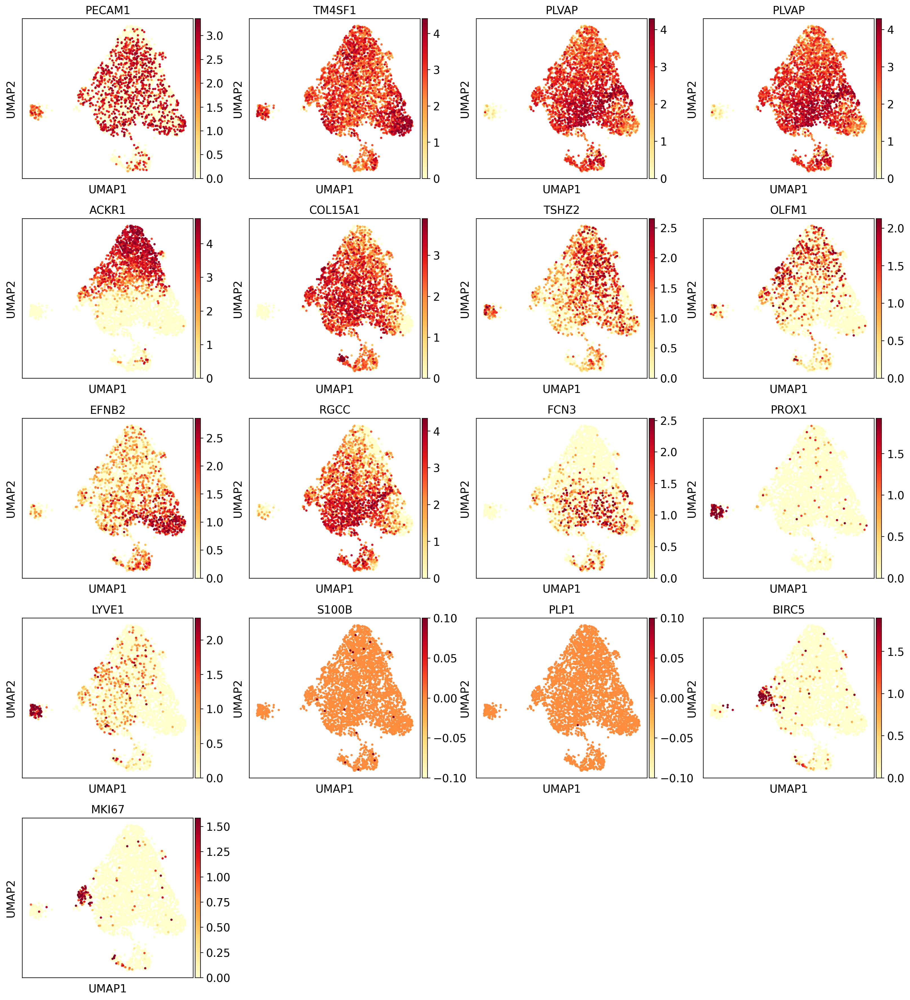

In [24]:
import itertools

# use log1p data stored in .raw
markers2plot = list(
    itertools.chain(*list(markers_cel.values()))
)  # get all markers in a single list
sc.pl.umap(
    adata,
    color=markers2plot,
    use_raw=True,
    vmin=0.0,
    vmax="p99",
    color_map="YlOrRd",  #'RdPu',
    save="general_markers_cap.pdf",
    show=True,
)

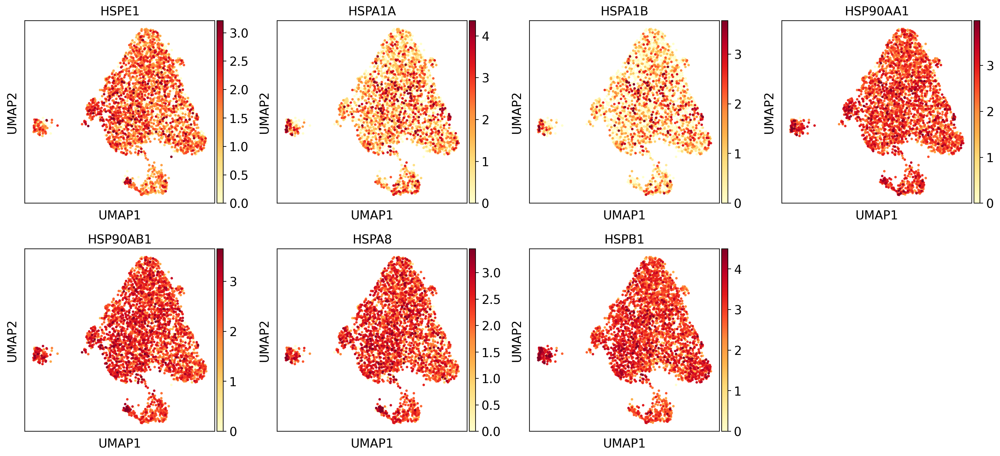

In [17]:
### markers for stress
# HSP
dissocation_markers_dict = {
    "shock protein": [
        "HSPE1",
        "HSPA1A",
        "HSPA1B",
        "HSP90AA1",
        "HSP90AB1",
        "HSPA8",
        "HSPB1",
    ],
    "immediate early genes": ["FOS", "JUN"],
}

sc.pl.umap(
    adata,
    color=dissocation_markers_dict["shock protein"],
    vmax="p99",
    use_raw=True,
    vmin=0,
    color_map="YlOrRd",
    save="general_HSPmarkers.pdf",
    show=True,
)

### Differential expression to get DE genes upregulated per cluster 

In [18]:
# issue here https://github.com/theislab/single-cell-tutorial/issues/97
# This seems to be a scanpy bug as you can see here and here. The latter issue suggests to just add the line:
# adata.uns['log1p']["base"] = None after reading again, or downgrading to AnnData<0.8.
# Either way, this should be fixed soon by the maintenance team.
adata.uns["log1p"]["base"] = None

In [19]:
sc.tl.rank_genes_groups(
    adata,
    groupby="leiden_scVI",
    reference="rest",
    method="wilcoxon",
    use_raw=True,
    layer=None,
    pts=True,
    corr_method="benjamini-hochberg",
    key_added="rank_genes_wilcoxon",
)

categories: 0, 1, 2, etc.
var_group_labels: Endo, Lymph endo, Stalk, etc.


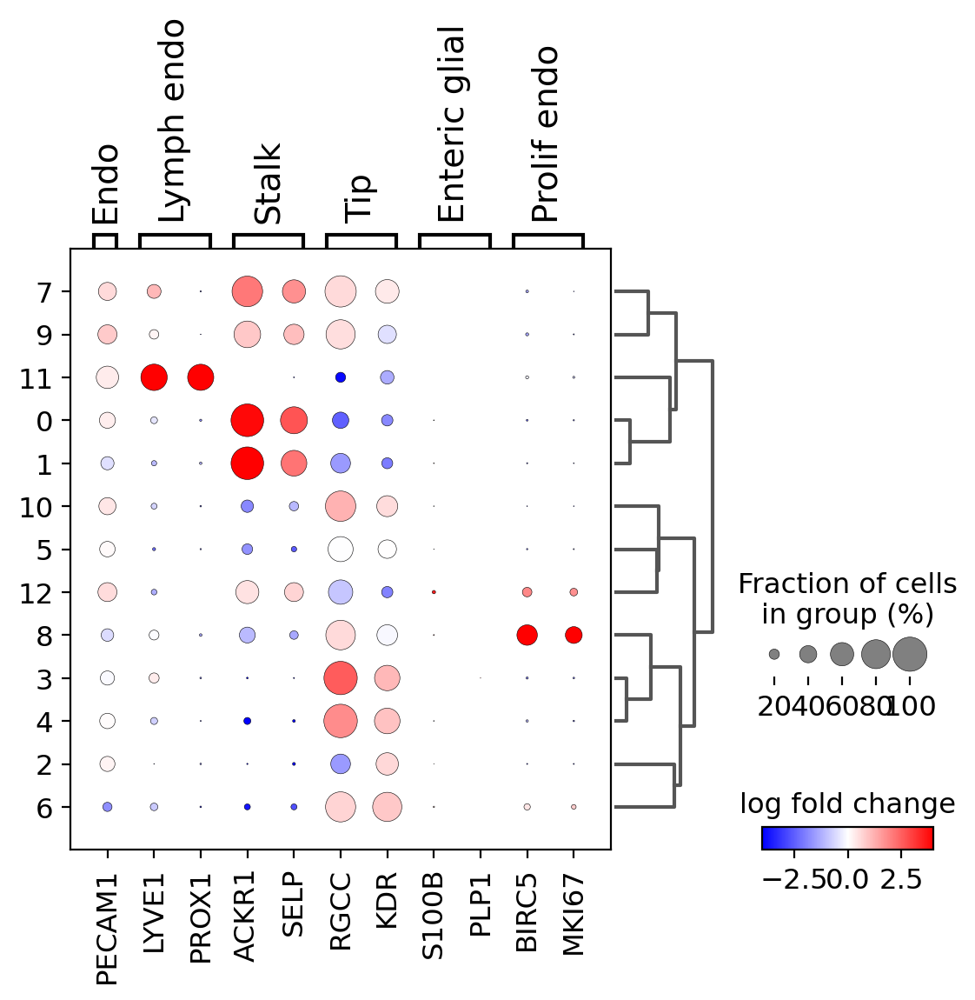

In [20]:
sc.pl.rank_genes_groups_dotplot(
    adata,
    groupby="leiden_scVI",
    key="rank_genes_wilcoxon",
    var_names=markers,
    values_to_plot="logfoldchanges",
    cmap="bwr",
    vmin=-4,
    vmax=4,
    min_logfoldchange=1,
    colorbar_title="log fold change",
    save="general_dotplot.pdf",
    show=True,
)

categories: 0, 1, 2, etc.
var_group_labels: Endo, Venous, Arterial, etc.


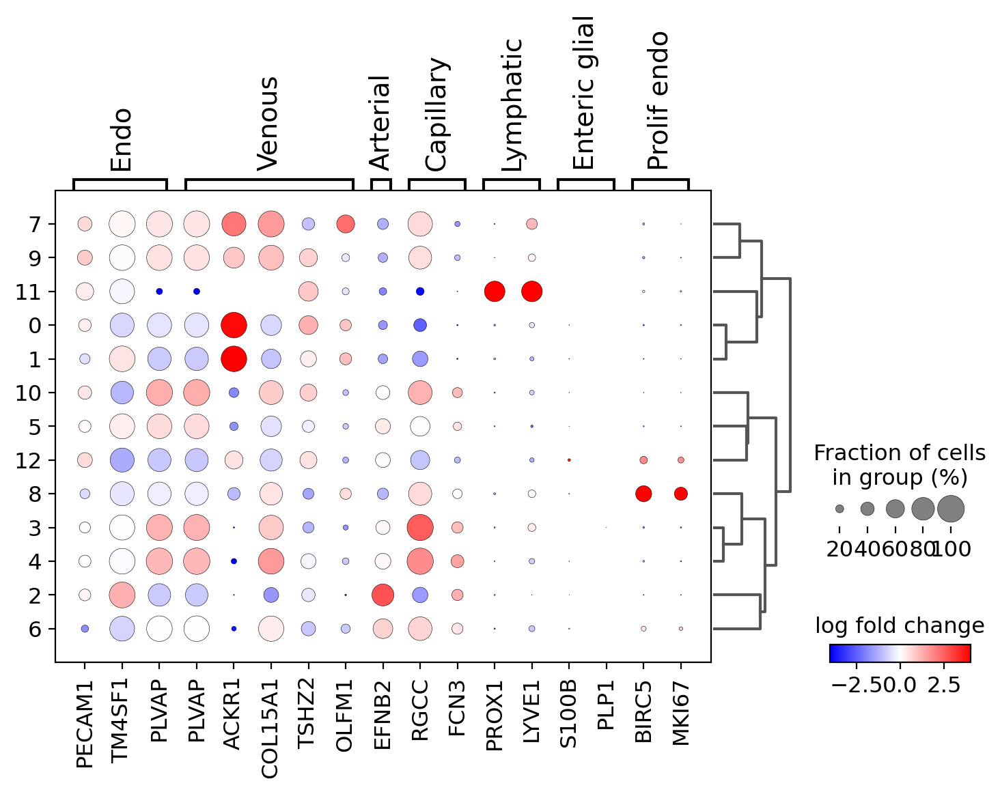

In [27]:
sc.pl.rank_genes_groups_dotplot(
    adata,
    groupby="leiden_scVI",
    key="rank_genes_wilcoxon",
    var_names=markers_cel,
    values_to_plot="logfoldchanges",
    cmap="bwr",
    vmin=-4,
    vmax=4,
    min_logfoldchange=1,
    colorbar_title="log fold change",
    save="general_dotplot_other.pdf",
    show=True,
)

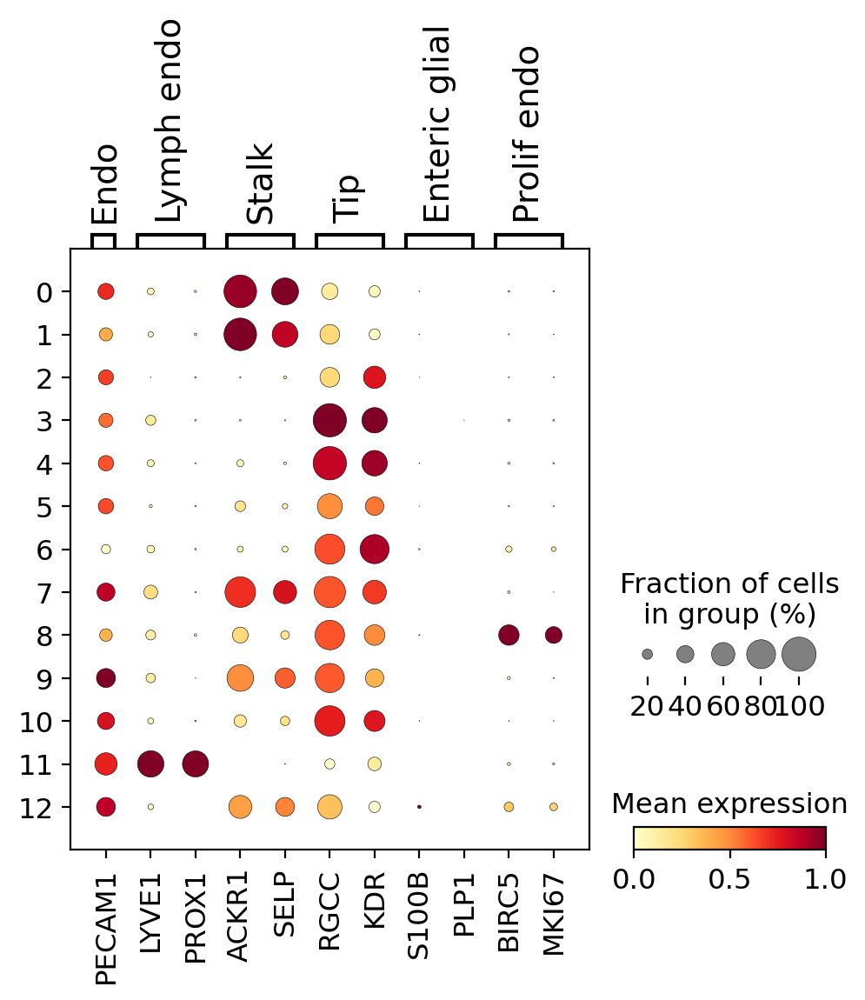

In [21]:
sc.pl.dotplot(
    adata,
    groupby="leiden_scVI",
    use_raw=True,
    var_names=markers,
    cmap="YlOrRd",
    standard_scale="var",
    vmin=0,
    vmax=1,
    colorbar_title="Mean expression",
    dendrogram=False,
    save="Endothelial_dotplot_mean_general.pdf",
    show=True,
)

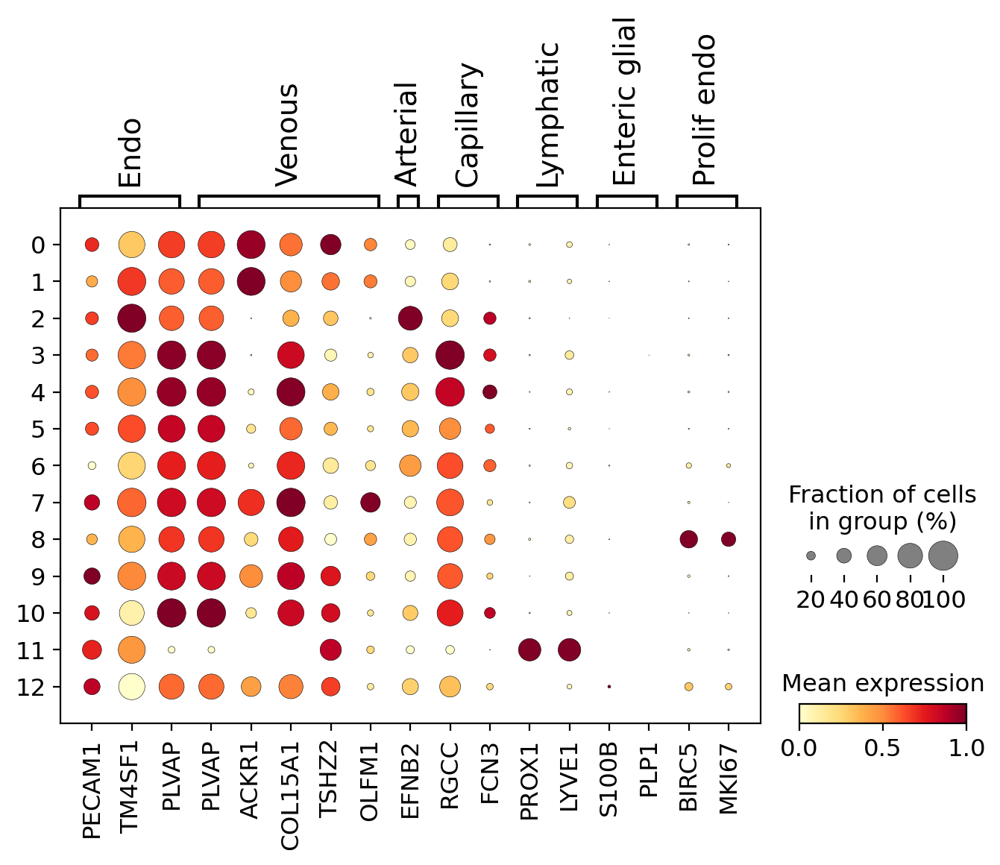

In [28]:
sc.pl.dotplot(
    adata,
    groupby="leiden_scVI",
    use_raw=True,
    var_names=markers_cel,
    cmap="YlOrRd",
    standard_scale="var",
    vmin=0,
    vmax=1,
    colorbar_title="Mean expression",
    dendrogram=False,
    save="Endothelial_dotplot_mean_general_other.pdf",
    show=True,
)

categories: 0, 1, 2, etc.
var_group_labels: shock protein, immediate early genes


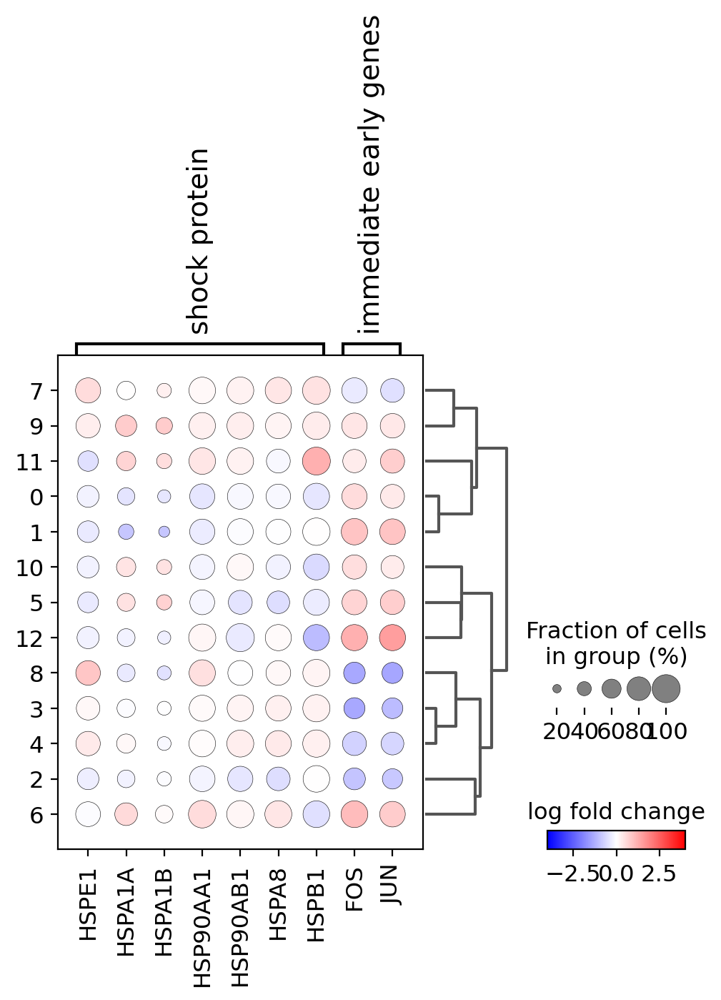

In [22]:
sc.pl.rank_genes_groups_dotplot(
    adata,
    groupby="leiden_scVI",
    key="rank_genes_wilcoxon",
    var_names=dissocation_markers_dict,
    values_to_plot="logfoldchanges",
    cmap="bwr",
    vmin=-4,
    vmax=4,
    min_logfoldchange=1,
    colorbar_title="log fold change",
    save="HSP_dotplot.pdf",
    show=True,
)

In [23]:
pval_thresh = 0.05
log2fc_thresh = 1
cluster_de_genes = dict()
for cluster in sorted(set(adata.obs["leiden_scVI"])):
    cluster_de_genes[cluster] = sc.get.rank_genes_groups_df(
        adata,
        group=cluster,
        key="rank_genes_wilcoxon",
        pval_cutoff=pval_thresh,
        log2fc_min=log2fc_thresh,
        log2fc_max=None,
    ).sort_values("logfoldchanges", ascending=False)

# write to excel file DE genes per cluster
# Create a Pandas Excel writer using XlsxWriter as the engine.
path2save = DIR2SAVE.joinpath(
    "Endothelial_pval{}_log2fc{}.xlsx".format(pval_thresh, log2fc_thresh)
)

with pd.ExcelWriter(path2save) as writer:
    for cluster in list(cluster_de_genes.keys()):

        # get celltype of cluster
        # celltype = np.unique(adata[adata.obs['leiden']==cluster,:].obs['cell identity'])[0]

        cluster_de_genes[cluster].to_excel(
            writer, sheet_name="cluster{}".format(cluster)
        )

In [24]:
# save intermediate result
# write to file
adata.write(
    DIR2SAVE.joinpath(
        "SMC_KUL_Pelka_Che_Wu_CRC_integrated_scvi_hvg_Endothelial_clustering.h5ad"
    )
)

In [25]:
adata.obs.Cell_subtype.value_counts()

cS13 (Endo venous-like)       638
Tip-like ECs                  604
Stalk-like ECs                459
cS12 (Endo)                   358
cS09 (Endo)                   300
cS08 (Endo arterial-like)     270
Endothelial                   190
cS10 (Endo tip cells)         156
cS02 (Endo capillary)         125
cS04 (Endo)                   123
cS03 (Endo capillary)          92
cS11 (Endo proif)              84
cS05 (Endo venous)             81
Lymphatic ECs                  56
cS07 (Endo capillary-like)     35
Proliferative ECs              33
cS06 (Endo lymphatic)          24
cS01 (Endo arterial)           10
Pericytes                       7
cS14 (Endo)                     3
cE01 (Stem/TA-like)             3
cS32 (Smooth Muscle)            1
CD19+CD20+ B                    1
cE03 (Stem/TA-like prolif)      1
cB2 (B GC-like)                 1
Stromal 1                       1
Regulatory T cells              1
NK cells                        1
cTNI09 (CD4+ Treg prolif)       1
Name: Cell_sub

In [13]:
adata[adata.obs["leiden_scVI"] == "2"].obs.Cell_subtype.value_counts()

cS08 (Endo arterial-like)     231
Tip-like ECs                  135
Endothelial                    16
cS09 (Endo)                    14
cS01 (Endo arterial)            9
Stalk-like ECs                  5
cS12 (Endo)                     4
cS02 (Endo capillary)           3
cS07 (Endo capillary-like)      2
cS13 (Endo venous-like)         2
cE01 (Stem/TA-like)             1
cS10 (Endo tip cells)           1
cS14 (Endo)                     1
Name: Cell_subtype, dtype: int64

## --- 

In [5]:
adata = sc.read_h5ad(
    DIR2SAVE.joinpath(
        "SMC_KUL_Pelka_Che_Wu_CRC_integrated_scvi_hvg_Endothelial_clustering.h5ad"
    )
)

### Annotations 

* 0 Stalk-like
* 1 Stalk-like
* 2 Arterial endo
* 3 Tip-like
* 4 Tip-like 
* 5 Myeloid-stromal doublet (CD74)
* 6 Doublet 
* 7 Stalk-like endo (Venous endo)
* 8 MKI67 Endo
* 9 Stalk-like endo (Venous endo)
* 10 Tip-like (Capillary endo)
* 11 Lymphatic endo
* 12 T-endo doublet 

**venous = stalk, capillary = tip**

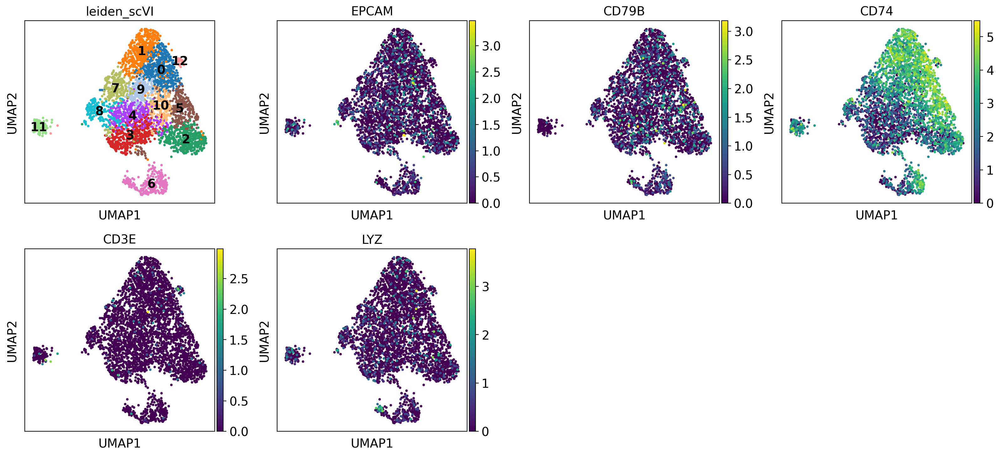

In [6]:
sc.pl.umap(
    adata,
    color=["leiden_scVI", "EPCAM", "CD79B", "CD74", "CD3E", "LYZ"],
    use_raw=True,
    legend_loc="on data",
)

In [7]:
old_to_new = {
    "0": "Stalk-like endo",
    "1": "Stalk-like endo",
    "2": "Tip-like endo",
    "3": "Tip-like endo",
    "4": "Tip-like endo",
    "5": "Myeloid-stromal doublet",
    "6": "Doublet",
    "7": "Stalk-like endo",
    "8": "Endo cycling",
    "9": "Stalk-like endo",
    "10": "Tip-like endo",
    "11": "Lymphatic endo",
    "12": "T-endo doublet",
}

In [8]:
adata.obs["Annotation_scVI_detailed"] = (
    adata.obs["leiden_scVI"].map(old_to_new).astype("category")
)

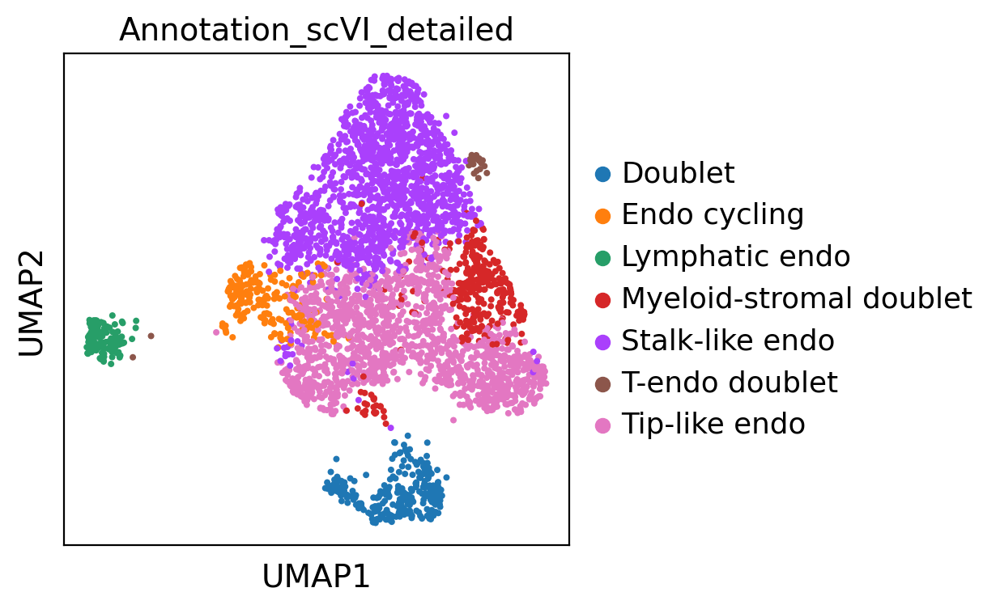

In [9]:
sc.pl.umap(
    adata, color="Annotation_scVI_detailed", show=True, legend_loc="right margin"
)

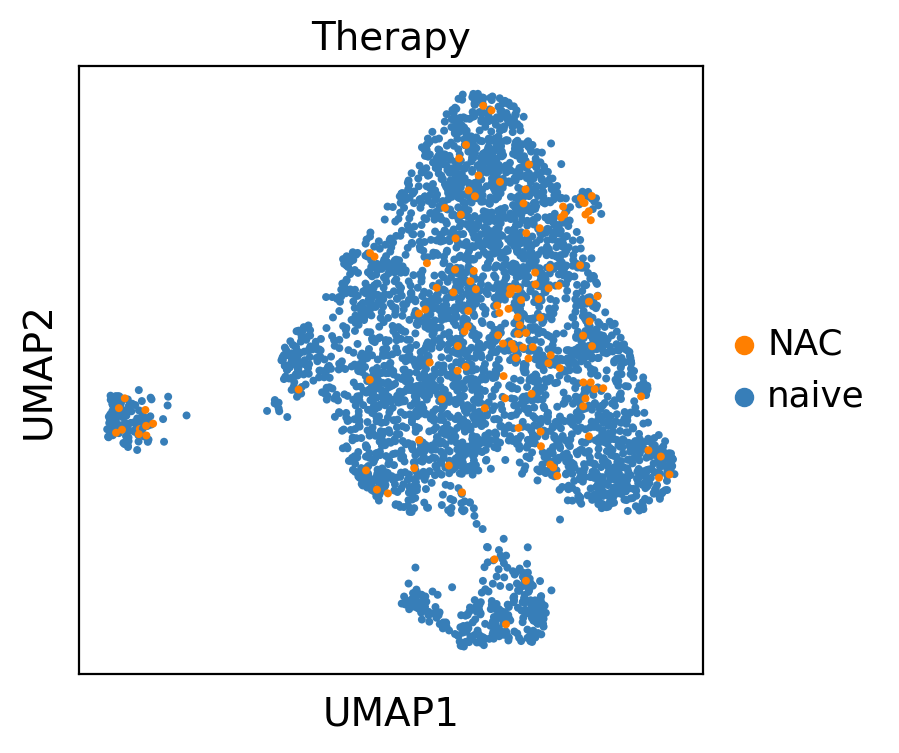

In [10]:
sc.pl.umap(adata, color="Therapy", show=True, legend_loc="right margin")

### Write to file

In [11]:
# write to file
adata.write(
    DIR2SAVE.joinpath(
        "SMC_KUL_Pelka_Che_Wu_CRC_integrated_scvi_hvg_Endothelial_clustering.h5ad"
    )
)

# write csv of annotations
adata.obs["Annotation_scVI_detailed"].to_csv(
    DIR2SAVE.joinpath(
        "SMC_KUL_Pelka_Che_Wu_CRC_integrated_scvi_hvg_Endothelial_annotations.txt"
    ),
    sep="\t",
    index=True,
    header=True,
)